# View of individueal Exposures Biases for night 20220317

- work with Weakly_2022_39
- use jupyter kernel LSST

- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab
- creation date : 2022/11/13


In [1]:
! eups list -s | grep LOCAL

atmospec              LOCAL:/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/repos/w_2022_39/atmospec 	setup
drp_pipe              LOCAL:/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/repos/w_2022_39/drp_pipe 	setup
eups                  LOCAL:/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2022_39/conda/envs/lsst-scipipe-4.1.0/eups 	setup
rapid_analysis        LOCAL:/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/repos/w_2022_39/rapid_analysis 	setup


In [2]:
! echo $IMAGE_DESCRIPTION
! eups list -s lsst_distrib


   g0b29ad24fb+a10408d0bf 	w_latest current w_2022_39 setup


In [3]:
import os
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
import matplotlib.dates as mdates

import numpy as np
import pandas as pd
%matplotlib inline
from matplotlib.colors import LogNorm

from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.ticker                         # here's where the formatter is
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from astropy.io import fits

In [4]:
# LSST Display
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

In [5]:
# Butler
import lsst.daf.butler as dafButler

In [6]:
repo = '/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/data/butler.yaml'
butler = dafButler.Butler(repo)
registry = butler.registry

In [7]:
# Assembly task
# https://github.com/lsst/ip_isr/blob/main/python/lsst/ip/isr/isrTask.py

from lsst.ip.isr.assembleCcdTask import (AssembleCcdConfig, AssembleCcdTask)
from lsst.ip.isr.isrTask import (IsrTask, IsrTaskConfig)

#https://github.com/lsst/ip_isr/blob/main/python/lsst/ip/isr/overscan.py
from lsst.ip.isr import  OverscanCorrectionTaskConfig, OverscanCorrectionTask

## List of Exposures from raw

In [8]:
df_exposure = pd.DataFrame(columns=['id', 'obs_id','day_obs', 'seq_num', 'type', 'target','filter','zenith_angle','ra','dec','skyangle','exptime'])

In [9]:
for count, info in enumerate(registry.queryDimensionRecords('exposure')):
    
    
    df_exposure.loc[count] = [info.id, info.obs_id, info.day_obs, info.seq_num, info.observation_type, info.target_name, info.physical_filter, info.zenith_angle, \
                             info.tracking_ra, info.tracking_dec, info.sky_angle,info.exposure_time]
    
    if count < 2:
        print("-----------------------------------------------------",count,"---------------------------------------------------------")
        print(info)
        print("\t id:                  ",info.id)
        print("\t day_obs:             ",info.day_obs)
        print("\t seq_num:             ",info.seq_num)
        print("\t type-of-observation: ",info.observation_type)
        print("\t target:              ",info.target_name)
        print("\t exposure_time:       ",info.exposure_time)
    

----------------------------------------------------- 0 ---------------------------------------------------------
exposure:
  instrument: 'LATISS'
  id: 2021021600208
  physical_filter: 'empty~empty'
  obs_id: 'AT_O_20210216_000208'
  exposure_time: 2.0
  dark_time: 2.33517265319824
  observation_type: 'science'
  observation_reason: 'science'
  day_obs: 20210216
  seq_num: 208
  group_name: '2021-02-17T03:35:45.035'
  group_id: 1934625450350000
  target_name: 'HD 50896'
  science_program: 'unknown'
  tracking_ra: 103.384001783548
  tracking_dec: -23.9734478006315
  sky_angle: -180.0
  zenith_angle: 24.314073266185005
  timespan: Timespan(begin=astropy.time.Time('2021-02-17 03:35:45.295446', scale='tai', format='iso'), end=astropy.time.Time('2021-02-17 03:35:47.540000', scale='tai', format='iso'))
	 id:                   2021021600208
	 day_obs:              20210216
	 seq_num:              208
	 type-of-observation:  science
	 target:               HD 50896
	 exposure_time:        2.0

In [10]:
df_exposure

,id,obs_id,day_obs,seq_num,type,target,filter,zenith_angle,ra,dec,skyangle,exptime
0,2021021600208,AT_O_20210216_000208,20210216,208,science,HD 50896,empty~empty,24.314073,103.384002,-23.973448,-180.0,2.0
1,2021021600163,AT_O_20210216_000163,20210216,163,science,HD 50896,RG610~empty,14.580611,103.404029,-23.92939,-208.621712,3.0
2,2021021600070,AT_O_20210216_000070,20210216,70,bias,azel_target,empty~empty,None,None,None,None,0.0
3,2021021600173,AT_O_20210216_000173,20210216,173,science,HD 50896,RG610~empty,8.82931,103.395986,-23.927038,-208.621712,2.0
4,2021021600001,AT_O_20210216_000001,20210216,1,bias,azel_target,empty~empty,None,None,None,None,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
21152,2022063000801,AT_O_20220630_000801,20220630,801,science,AUXTEL_DRP_IMAGING:WFI-2026-4536_062,SDSSr~empty,36.396484,306.677395,-45.325215,359.998841,30.0
21153,2022063000802,AT_O_20220630_000802,20220630,802,science,AUXTEL_DRP_IMAGING:WFI-2026-4536_063,SDSSr~empty,36.437127,306.811224,-45.325305,0.005404,30.0
21154,2022063000803,AT_O_20220630_000803,20220630,803,science,AUXTEL_DRP_IMAGING:WFI-2026-4536_063,SDSSr~empty,36.530061,306.811146,-45.325195,359.99891,30.0
21155,2022063000804,AT_O_20220630_000804,20220630,804,science,AUXTEL_DRP_IMAGING:WFI-2026-4536_064,SDSSr~empty,36.57364,306.944962,-45.325294,359.998843,30.0


## Selection of flats raw-exposures

In [11]:
df_bias = df_exposure[df_exposure.type == 'bias']

In [12]:
df_bias = df_bias.sort_values(by="day_obs",ascending=True)

In [13]:
df_bias.tail(50)

,id,obs_id,day_obs,seq_num,type,target,filter,zenith_angle,ra,dec,skyangle,exptime
17496,2022060800010,AT_O_20220608_000010,20220608,10,bias,FlatField position,empty~empty,None,None,None,None,0.0
17497,2022060800011,AT_O_20220608_000011,20220608,11,bias,FlatField position,empty~empty,None,None,None,None,0.0
17498,2022060800012,AT_O_20220608_000012,20220608,12,bias,FlatField position,empty~empty,None,None,None,None,0.0
17597,2022060800111,AT_O_20220608_000111,20220608,111,bias,FlatField position,FELH0600~empty,None,None,None,None,0.0
17500,2022060800014,AT_O_20220608_000014,20220608,14,bias,FlatField position,empty~empty,None,None,None,None,0.0
17499,2022060800013,AT_O_20220608_000013,20220608,13,bias,FlatField position,empty~empty,None,None,None,None,0.0
17502,2022060800016,AT_O_20220608_000016,20220608,16,bias,FlatField position,empty~empty,None,None,None,None,0.0
17595,2022060800109,AT_O_20220608_000109,20220608,109,bias,FlatField position,FELH0600~empty,None,None,None,None,0.0
17594,2022060800108,AT_O_20220608_000108,20220608,108,bias,FlatField position,FELH0600~empty,None,None,None,None,0.0
17501,2022060800015,AT_O_20220608_000015,20220608,15,bias,FlatField position,empty~empty,None,None,None,None,0.0


# List of dates

In [14]:
list_of_dates_bias = df_bias['day_obs'].unique() 
list_of_dates_bias

array([20210216, 20210217, 20210218, 20210311, 20210608, 20210609,
       20210610, 20210706, 20210707, 20210708, 20210907, 20210908,
       20210909, 20211005, 20211006, 20211007, 20211102, 20211103,
       20211104, 20220215, 20220216, 20220217, 20220315, 20220316,
       20220317, 20220318, 20220502, 20220503, 20220504, 20220524,
       20220607, 20220608, 20220609, 20220628, 20220629, 20220630])

# Selection of the biases

In [15]:
if 0:
    for the_date in list_of_dates_bias:
        cut_date = df_bias['day_obs'] == the_date
        cut_combined = cut_date 
    
        df_bias_this_date = df_bias[cut_combined]
    
        N = len(df_bias_this_date) 
        if N >0:
            print("=======================================================================")   
            print(f"{the_date} :: N={N}")
            print(df_bias_this_date.id.values)
    

# View the Exposures for the selected date

In [16]:
cut_date = df_bias['day_obs'] == 20220317
cut_combined = cut_date 

In [17]:
df_bias_this_date = df_bias[cut_combined]

In [18]:
N = len(df_bias_this_date)
df_bias_this_date = df_bias_this_date.sort_values(by="id").reset_index()

In [19]:
df_bias_this_date 

,index,id,obs_id,day_obs,seq_num,type,target,filter,zenith_angle,ra,dec,skyangle,exptime
0,14208,2022031700001,AT_O_20220317_000001,20220317,1,bias,Park position,SDSSg~empty,None,None,None,None,0.0
1,14092,2022031700003,AT_O_20220317_000003,20220317,3,bias,FlatField position,SDSSg~holo4_003,None,None,None,None,0.0
2,13932,2022031700004,AT_O_20220317_000004,20220317,4,bias,FlatField position,SDSSg~holo4_003,None,None,None,None,0.0
3,14036,2022031700005,AT_O_20220317_000005,20220317,5,bias,FlatField position,SDSSg~holo4_003,None,None,None,None,0.0
4,13886,2022031700006,AT_O_20220317_000006,20220317,6,bias,FlatField position,SDSSg~holo4_003,None,None,None,None,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,14184,2022031700069,AT_O_20220317_000069,20220317,69,bias,FlatField position,SDSSg~holo4_003,None,None,None,None,0.0
58,13858,2022031700070,AT_O_20220317_000070,20220317,70,bias,FlatField position,SDSSg~holo4_003,None,None,None,None,0.0
59,13986,2022031700071,AT_O_20220317_000071,20220317,71,bias,FlatField position,SDSSg~holo4_003,None,None,None,None,0.0
60,13973,2022031700072,AT_O_20220317_000072,20220317,72,bias,FlatField position,SDSSg~holo4_003,None,None,None,None,0.0


/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/data/LATISS/raw/all/raw/20220317/AT_O_20220317_000001/raw_LATISS_SDSSg~empty_AT_O_20220317_000001_RXX_S00_LATISS_raw_all.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/data/LATISS/raw/all/raw/20220317/AT_O_20220317_000003/raw_LATISS_SDSSg~holo4_003_AT_O_20220317_000003_RXX_S00_LATISS_raw_all.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/data/LATISS/raw/all/raw/20220317/AT_O_20220317_000004/raw_LATISS_SDSSg~holo4_003_AT_O_20220317_000004_RXX_S00_LATISS_raw_all.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/data/LATISS/raw/a

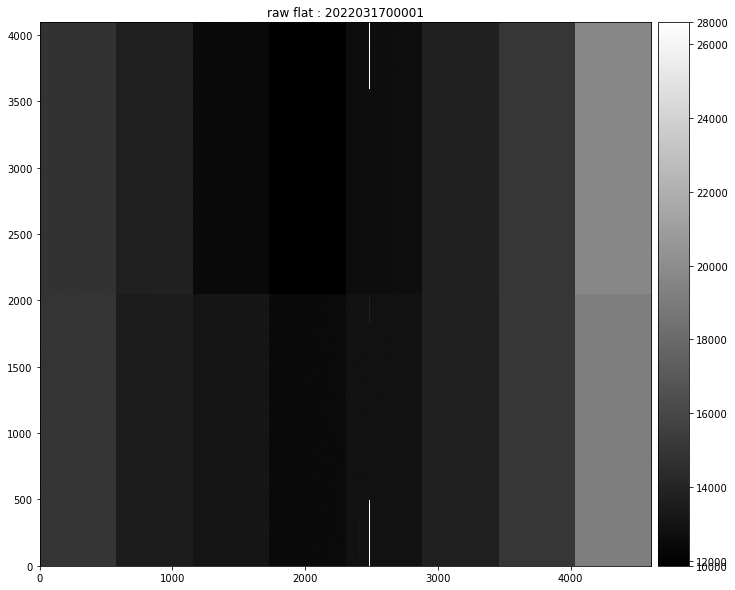

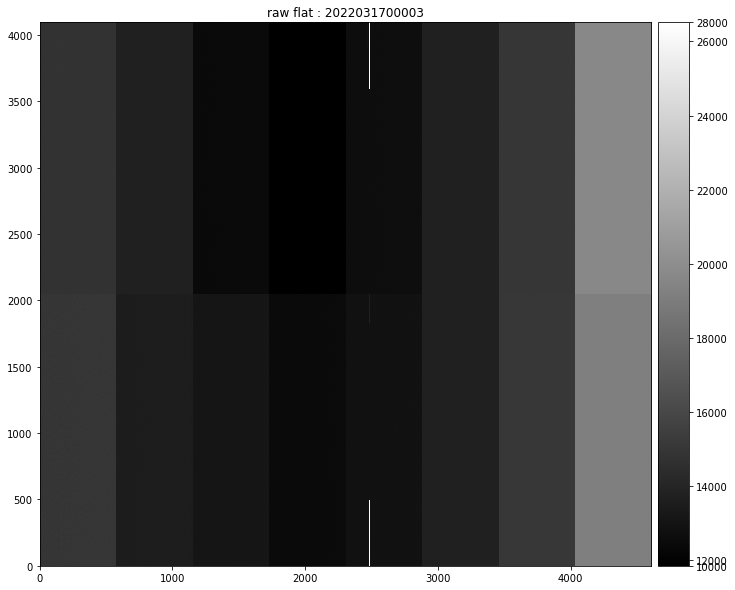

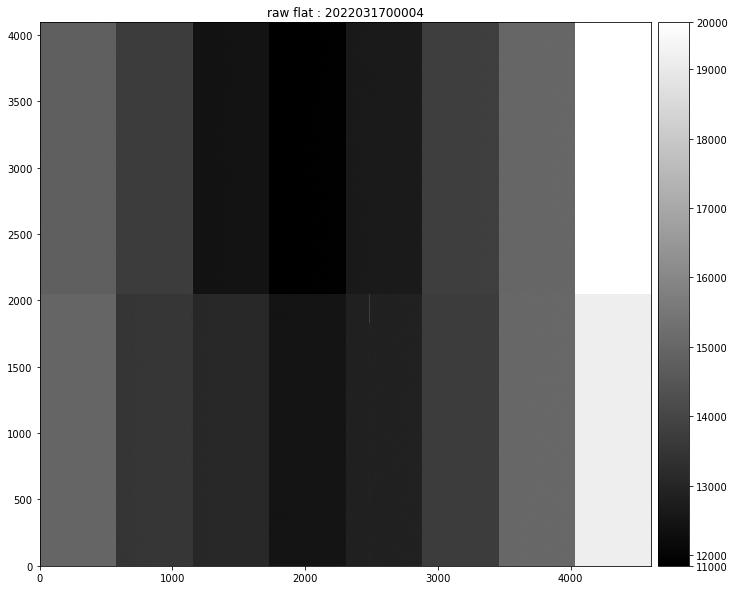

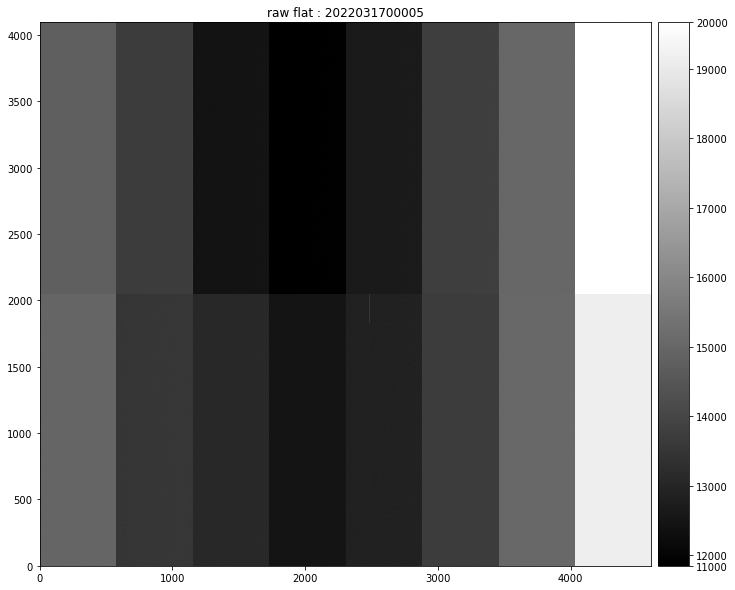

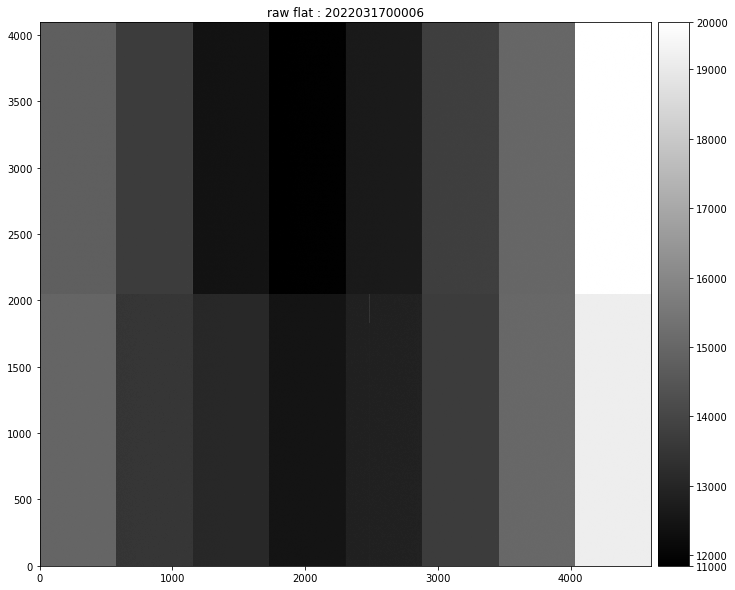

...

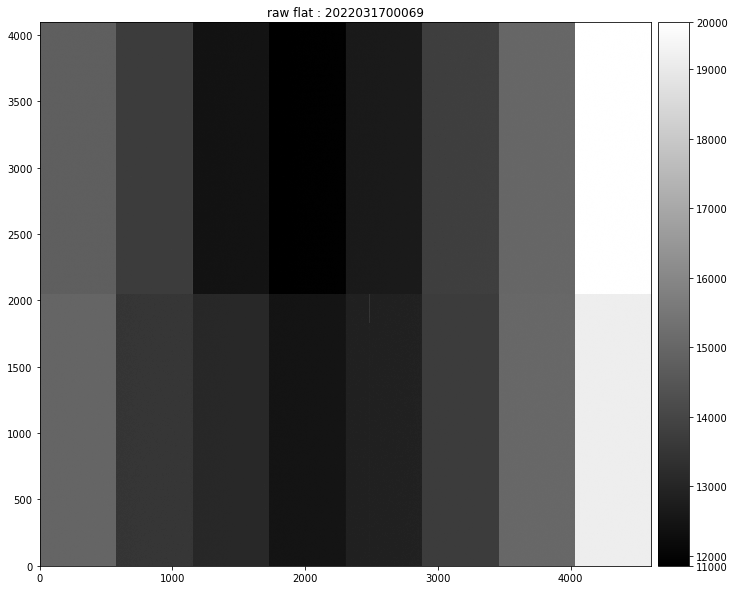

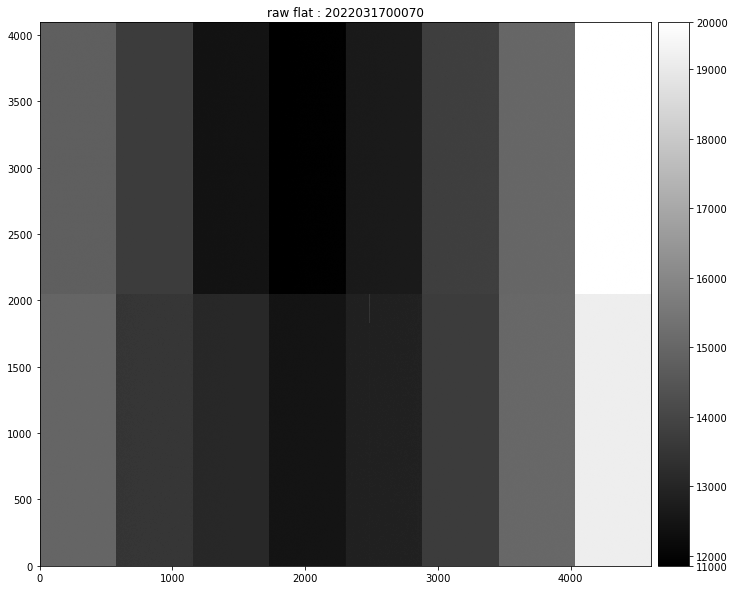

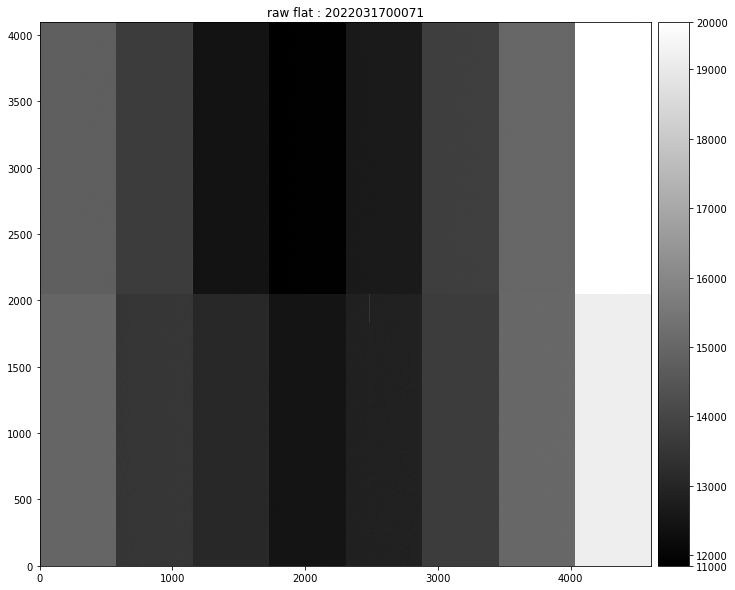

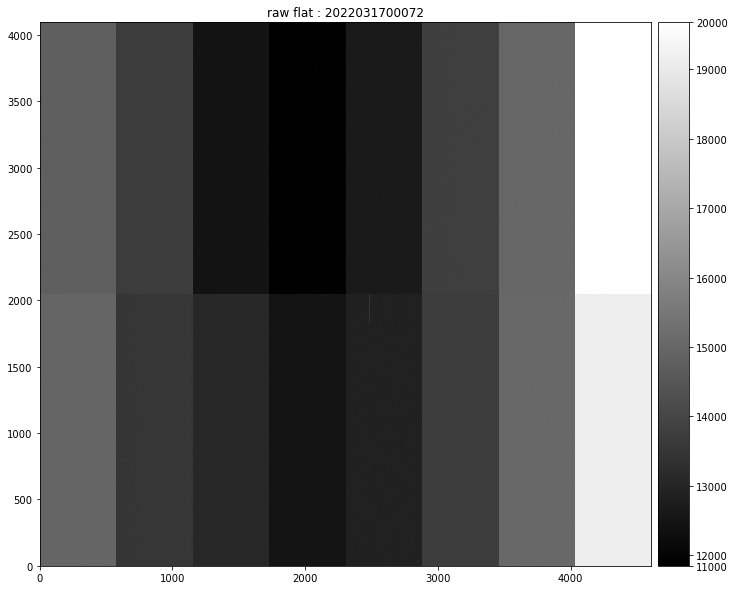

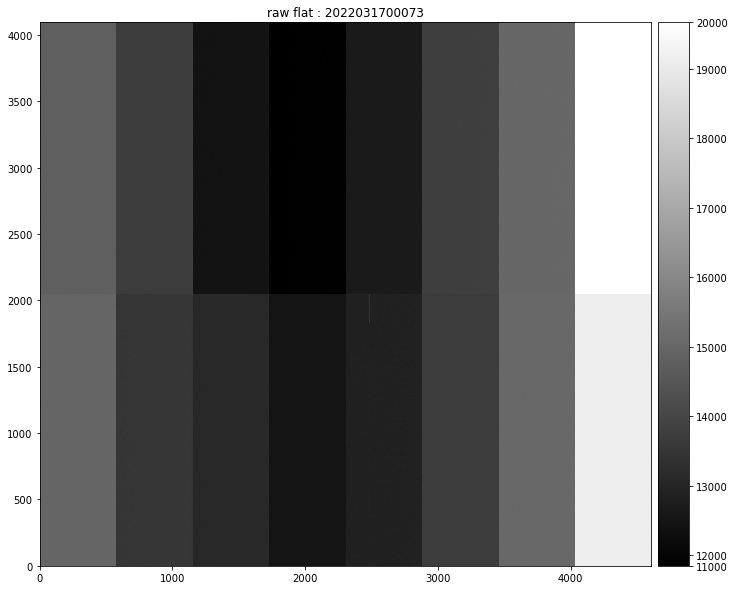

In [20]:
collection='LATISS/raw/all'

# loop on exposures
for idx in range(N):
    exposure_selected=df_bias_this_date.iloc[idx].id 
    
   
    raw_img = butler.get('raw', dataId={'exposure': exposure_selected, 'instrument': 'LATISS', 'detector': 0}, collections = collection)

    fig = plt.figure(figsize=(12,10))
    afw_display = afwDisplay.Display(frame=fig)
    afw_display.scale('linear', 'zscale',None)
    title = f"raw flat : {exposure_selected}"
    afw_display.mtv(raw_img.image,title=title)
    #plt.gca().axis('off')
    

## Assembly task
- examples here : 
https://github.com/lsst/ip_isr/blob/main/tests/test_assembleCcd.py

In [21]:
ass_config = AssembleCcdConfig(doTrim=True,keysToRemove=['SHEEP', 'MONKEYS', 'ZSHEEP'])
ass_task = AssembleCcdTask(config=ass_config)

In [22]:
#collection='LATISS/raw/all'

# loop on exposures
#for idx in range(N):
#    exposure_selected=df_bias_this_date.iloc[idx].id 
    
   
#    raw_img = butler.get('raw', dataId={'exposure': exposure_selected, 'instrument': 'LATISS', 'detector': 0}, collections = collection)
#    ass_img = ass_task.assembleCcd(raw_img)

#    fig = plt.figure(figsize=(12,10))
#    afw_display = afwDisplay.Display(frame=fig)
#    afw_display.scale('linear', 'zscale',None)
#    title = f"raw bias : {exposure_selected}"
#    afw_display.mtv(ass_img.image,title=title)
    

# Select One Bias Exposure and view assembled

https://github.com/lsst/cp_pipe/blob/main/python/lsst/cp/pipe/cpFlatNormTask.py

In [23]:
idx_sel= 0
exposure_selected=df_bias_this_date.iloc[idx_sel].id     
raw_img = butler.get('raw', dataId={'exposure': exposure_selected, 'instrument': 'LATISS', 'detector': 0}, collections = collection)
ass_img = ass_task.assembleCcd(raw_img)

/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/data/LATISS/raw/all/raw/20220317/AT_O_20220317_000001/raw_LATISS_SDSSg~empty_AT_O_20220317_000001_RXX_S00_LATISS_raw_all.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


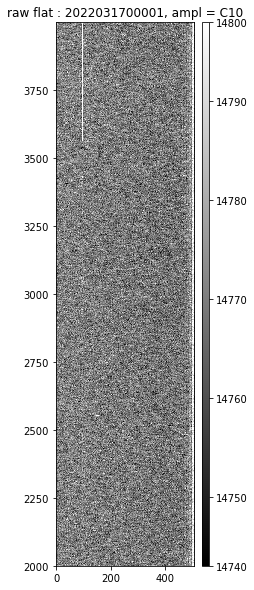

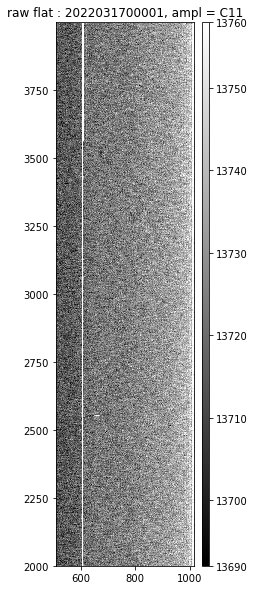

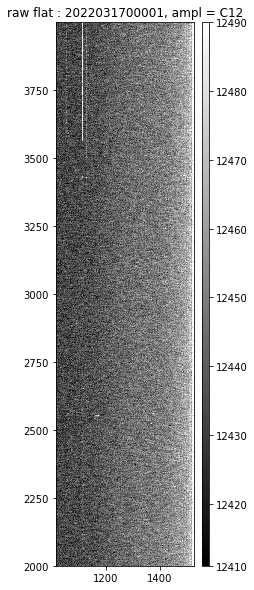

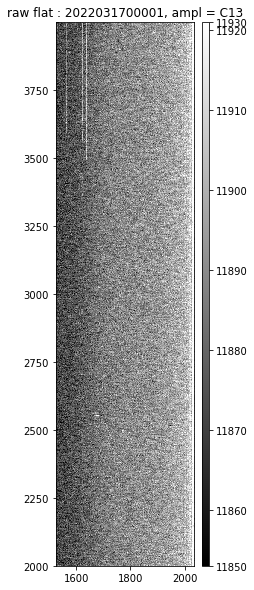

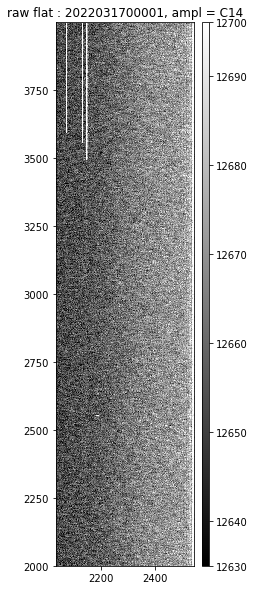

...

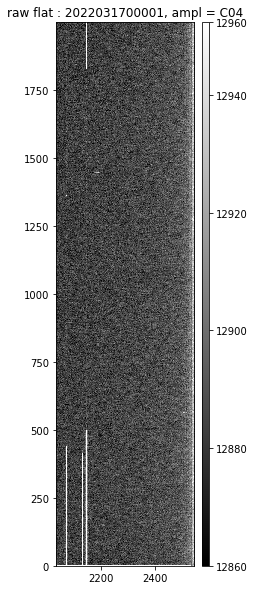

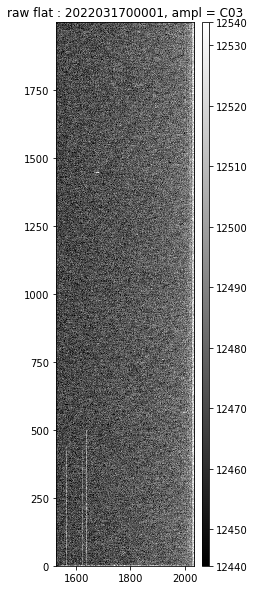

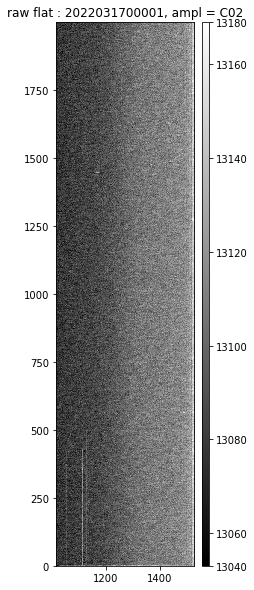

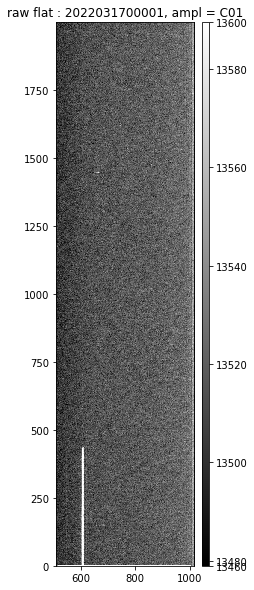

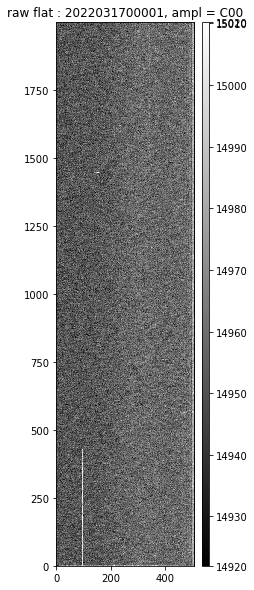

In [24]:
for ampIdx, amp in enumerate(ass_img.getDetector()):
    ampName = amp.getName()
    # This can work only on postISRCCD
    ampExp = ass_img.Factory(ass_img, amp.getBBox())
    
    fig = plt.figure(figsize=(5,10))
    afw_display = afwDisplay.Display(frame=fig)
    afw_display.scale('linear', 'zscale',None)
    title = f"raw flat : {exposure_selected}, ampl = {ampName}"
    afw_display.mtv(ampExp.image,title=title)

# Perform ISR-Overscan on the Bias Exposure

- Overscan
- defects
- Do not apply bias to bias exposure

In [25]:
# configuration
isr_config =  IsrTaskConfig()

In [26]:
isr_config.doDark = False
isr_config.doFlat =  False
isr_config.doFringe = False
isr_config.doDefect = True
isr_config.doLinearize = False
isr_config.doCrosstalk =  False
isr_config.doSaturationInterpolation = False
isr_config.overscan.fitType: 'MEDIAN_PER_ROW'
isr_config.doBias: False

In [27]:
isr_task = IsrTask(config=isr_config)

In [28]:
calibType = 'bias'
physical_filter = 'empty~empty'
cameraName = 'LATISS'
# Collection name containing the verification outputs.
calibCollections = ['LATISS/calib','LATISS/raw/all', \
                    'u/calib/DM-32209-20211013a-felh', \
'u/calib/DM-32209-20211013a-g',
'u/czw/DM-28920/biasGen.20210702a/20210702T215049Z',
'u/czw/DM-28920/calib/bias.20210720',
'u/czw/DM-28920/calib/dark.20210720a',
'u/czw/DM-28920/calib/defect.20210720a',
'u/czw/DM-28920/calib/flat.20210720',
'u/czw/DM-28920/darkGen.20210707d/20210707T215331Z',
'u/czw/DM-28920/defectGen.20210720a/20210720T230634Z',
'u/czw/DM-28920/flatGen.20210720Xa/20210720T223935Z',
'u/czw/DM-28920/flatGen.20210720Xb/20210720T225330Z',
'u/czw/DM-32209/flatGen.20211013a-felh/20211013T214128Z',
'u/czw/DM-32209/flatGen.20211013a-g/20211013T185808Z',
'u/czw/calibX',
'u/czw/calibX.20220608',
'u/czw/defects.20220608']

In [29]:
calibCollections

['LATISS/calib',
 'LATISS/raw/all',
 'u/calib/DM-32209-20211013a-felh',
 'u/calib/DM-32209-20211013a-g',
 'u/czw/DM-28920/biasGen.20210702a/20210702T215049Z',
 'u/czw/DM-28920/calib/bias.20210720',
 'u/czw/DM-28920/calib/dark.20210720a',
 'u/czw/DM-28920/calib/defect.20210720a',
 'u/czw/DM-28920/calib/flat.20210720',
 'u/czw/DM-28920/darkGen.20210707d/20210707T215331Z',
 'u/czw/DM-28920/defectGen.20210720a/20210720T230634Z',
 'u/czw/DM-28920/flatGen.20210720Xa/20210720T223935Z',
 'u/czw/DM-28920/flatGen.20210720Xb/20210720T225330Z',
 'u/czw/DM-32209/flatGen.20211013a-felh/20211013T214128Z',
 'u/czw/DM-32209/flatGen.20211013a-g/20211013T185808Z',
 'u/czw/calibX',
 'u/czw/calibX.20220608',
 'u/czw/defects.20220608']

In [30]:
butler = dafButler.Butler('/sps/lsst/groups/auxtel/softs/shared/auxteldm_gen3/data/butler.yaml', collections=calibCollections)
camera = butler.get('camera', instrument=cameraName)
bias = butler.get('bias',instrument=cameraName,detector=0)
defects = butler.get('defects',instrument=cameraName,detector=0)

In [31]:
#fig = plt.figure(figsize=(12,10))
#afw_display = afwDisplay.Display(frame=fig)
#afw_display.scale('linear', 'zscale',None)
#title = f"Master bias "
#afw_display.mtv(bias.image,title=title)

In [32]:
#isr_img = isr_task.run(raw_img,bias=bias)
isr_img = isr_task.run(raw_img,bias=bias,defects=defects)

No WCS found in input exposure.
No rough magnitude zero point defined for filter SDSSg~empty.
Non-positive exposure time; skipping rough zero point.


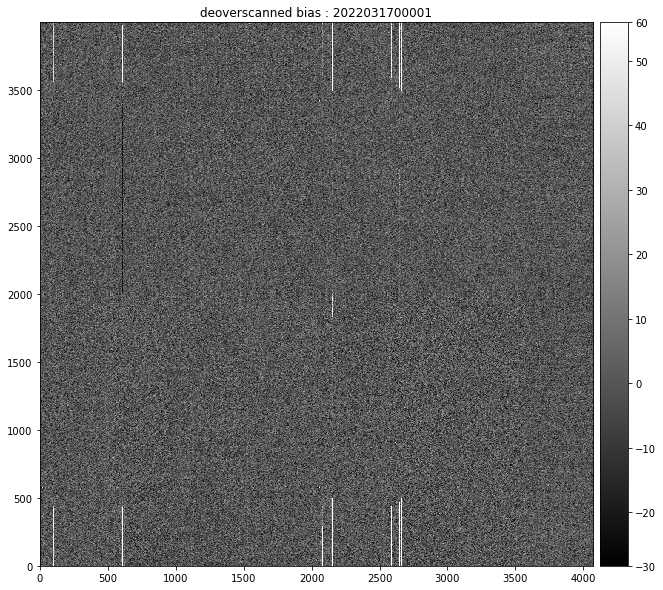

In [39]:
fig = plt.figure(figsize=(12,10))
afw_display = afwDisplay.Display(frame=fig)
afw_display.scale('linear', 'zscale',None)
title = f"deoverscanned bias : {exposure_selected}"
afw_display.mtv(isr_img.exposure.image,title=title)

## View deoverscanned amplifiers one by one

/scratch/users/d/dagoret/ipykernel_2288/2458917460.py:21: RuntimeWarning: invalid value encountered in sqrt
  the_rmse=np.sqrt(the_mse)
/scratch/users/d/dagoret/ipykernel_2288/2458917460.py:21: RuntimeWarning: invalid value encountered in sqrt
  the_rmse=np.sqrt(the_mse)
/scratch/users/d/dagoret/ipykernel_2288/2458917460.py:21: RuntimeWarning: invalid value encountered in sqrt
  the_rmse=np.sqrt(the_mse)
/scratch/users/d/dagoret/ipykernel_2288/2458917460.py:21: RuntimeWarning: invalid value encountered in sqrt
  the_rmse=np.sqrt(the_mse)
/scratch/users/d/dagoret/ipykernel_2288/2458917460.py:21: RuntimeWarning: invalid value encountered in sqrt
  the_rmse=np.sqrt(the_mse)
/scratch/users/d/dagoret/ipykernel_2288/2458917460.py:21: RuntimeWarning: invalid value encountered in sqrt
  the_rmse=np.sqrt(the_mse)
/scratch/users/d/dagoret/ipykernel_2288/2458917460.py:21: RuntimeWarning: invalid value encountered in sqrt
  the_rmse=np.sqrt(the_mse)
/scratch/users/d/dagoret/ipykernel_2288/24589174

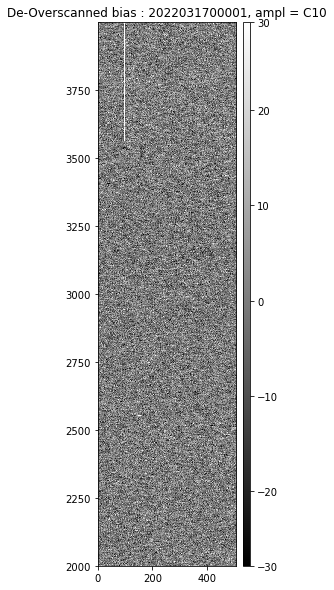

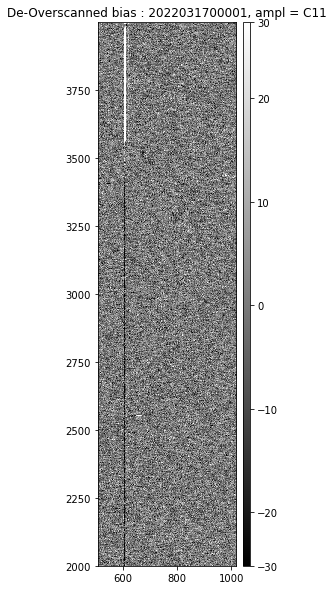

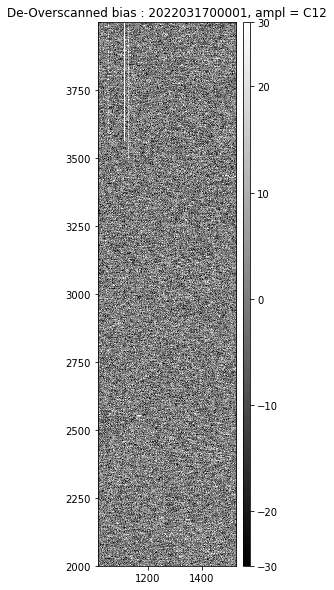

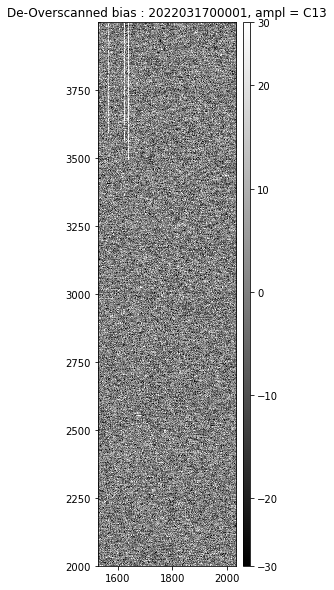

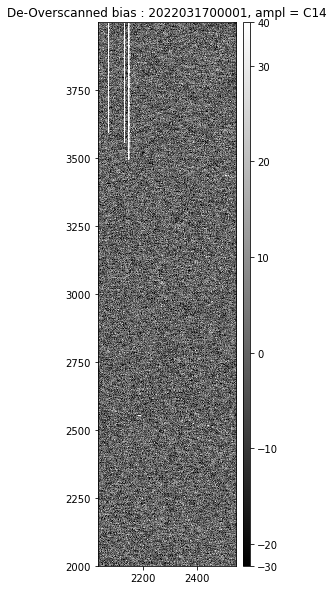

...

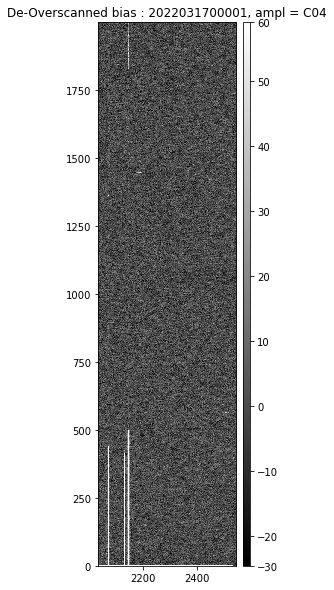

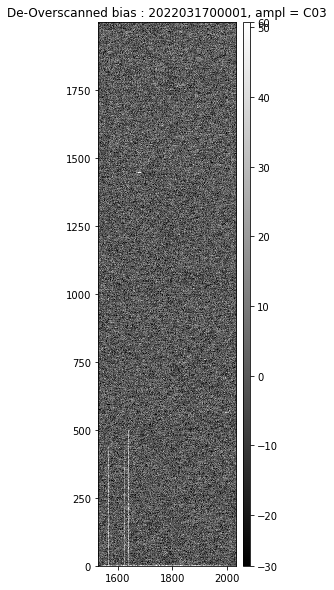

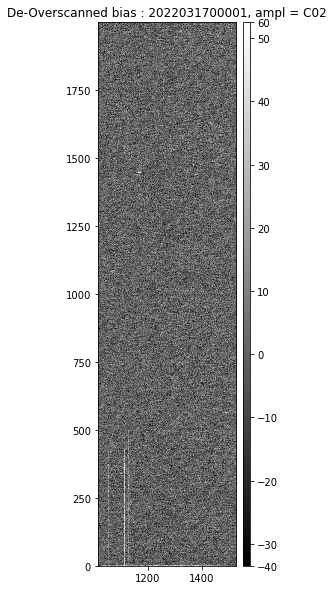

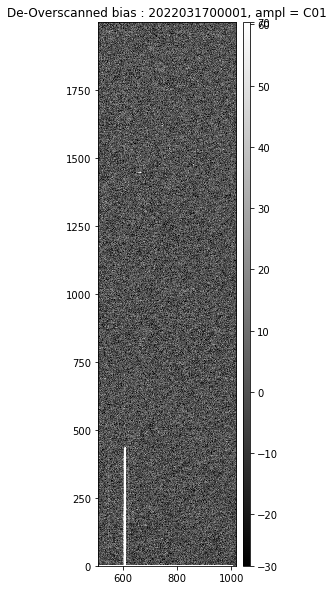

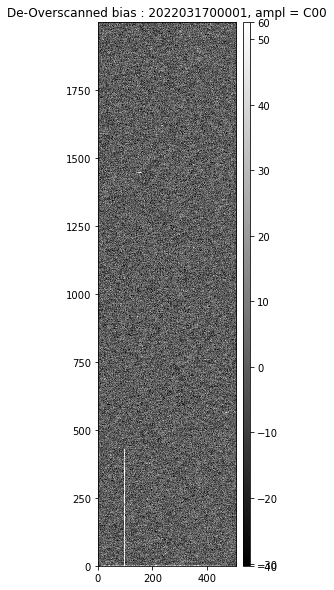

In [40]:
all_names = []
all_mean = []
all_median = []
all_std = []


for ampIdx, amp in enumerate(isr_img.exposure.getDetector()):
    ampName = amp.getName()
    # This can work only on postISRCCD
    ampExp = isr_img.exposure.Factory(isr_img.exposure, amp.getBBox())
    
    fig = plt.figure(figsize=(5,10))
    afw_display = afwDisplay.Display(frame=fig)
    afw_display.scale('linear', 'zscale',None)
    title = f"De-Overscanned bias : {exposure_selected}, ampl = {ampName}"
    afw_display.mtv(ampExp.image,title=title)
    
     # compute sigma relative to median
    the_med=np.median(ampExp.image.array,axis=0)
    the_mse=np.mean(ampExp.image.array-the_med,axis=0)
    the_rmse=np.sqrt(the_mse)
    

    all_names.append(ampName)
    all_mean.append(np.average(ampExp.image.array,axis=0))
    all_median.append(np.median(ampExp.image.array,axis=0))
    #all_std.append(np.std(ampExp.image.array,axis=0))
    all_std.append(the_rmse)

# View Bias columns

In [41]:
N  = len(all_names)
jet = plt.get_cmap('jet')
cNorm = colors.Normalize(vmin=0, vmax=N)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors = scalarMap.to_rgba(np.arange(N), alpha=1)

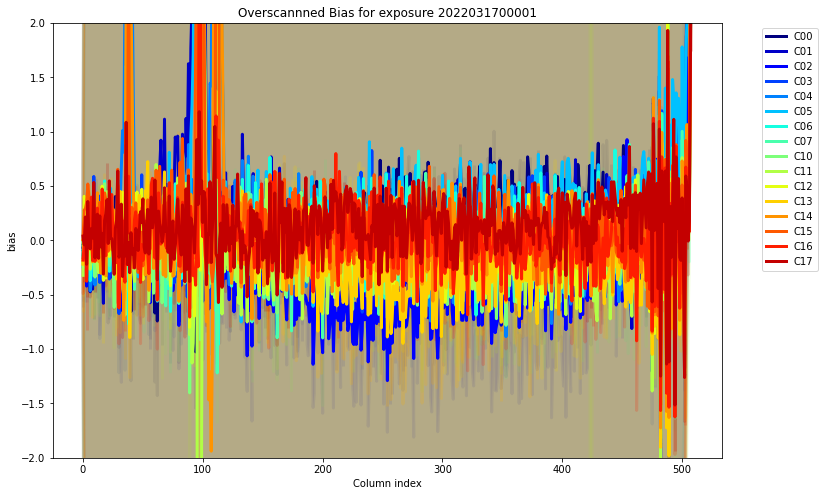

In [42]:
indexes=np.argsort(all_names)
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(12,8))
for idx in range(N):
    idx1=indexes[idx]
    NX=all_median[idx1].shape[0]
    x=np.arange(NX)
    ax.plot(x,all_median[idx1],color=all_colors[idx],label=all_names[idx1],lw=3)
    ax.fill_between(x,y1=all_median[idx1]+all_std[idx1],y2=all_median[idx1]-all_std[idx1],color=all_colors[idx],alpha=0.2,lw=3)
ax.legend(bbox_to_anchor=(1.15, 1.0))
title = f"Overscannned Bias for exposure {exposure_selected}"
ax.set_title(title)
ax.set_xlabel("Column index")
ax.set_ylabel("bias")
ax.set_ylim(-2,2)
plt.show()

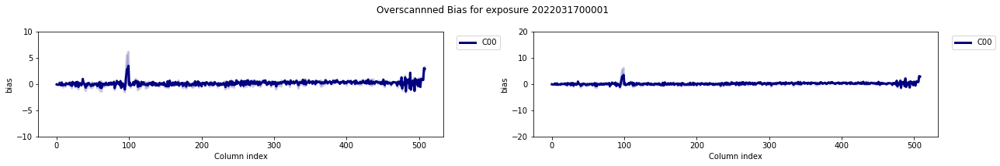

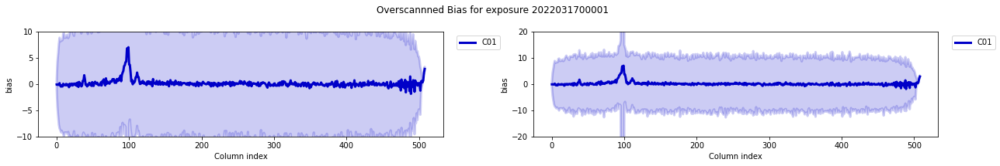

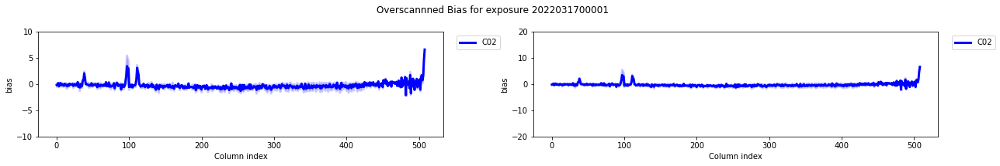

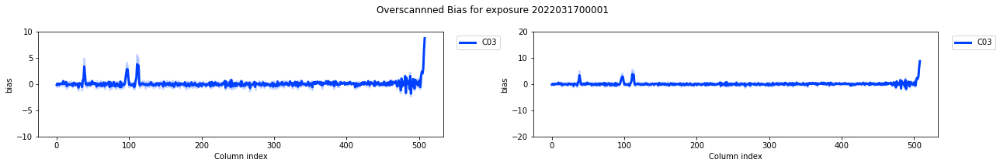

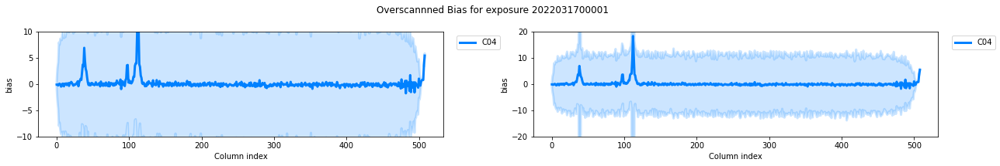

...

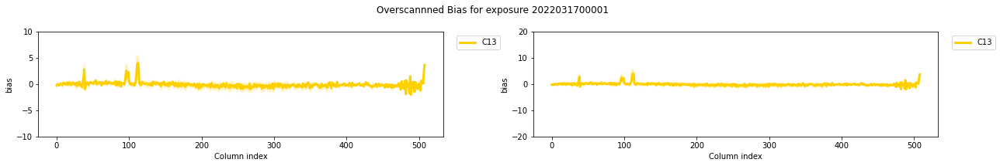

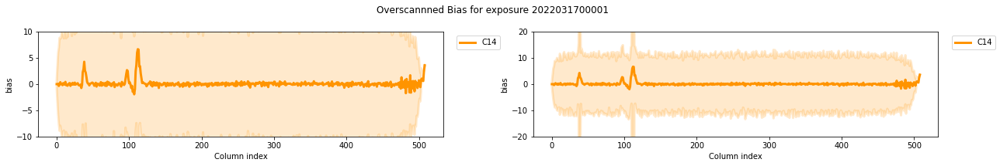

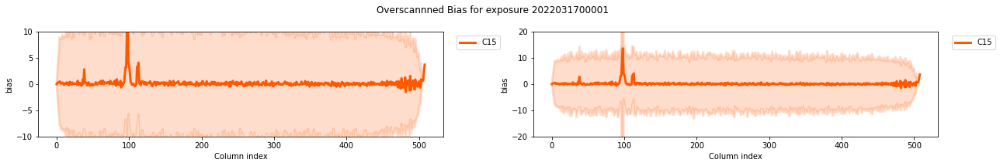

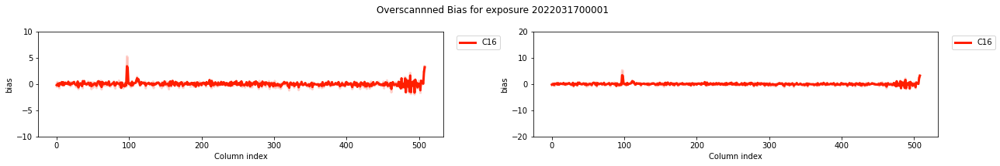

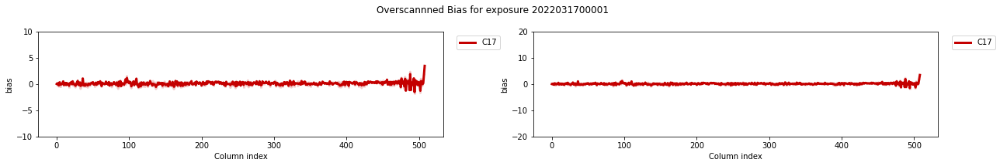

In [43]:
for idx in range(N):
    fig, ax = plt.subplots(nrows=1, ncols=2,figsize=(18,3))
    idx1=indexes[idx]
    NX=all_median[idx1].shape[0]
    x=np.arange(NX)
    ax[0].plot(x,all_median[idx1],color=all_colors[idx],label=all_names[idx1],lw=3)
    ax[0].fill_between(x,y1=all_median[idx1]+all_std[idx1],y2=all_median[idx1]-all_std[idx1],color=all_colors[idx],alpha=0.2,lw=3)
    ax[0].legend(bbox_to_anchor=(1.15, 1.0))
    ax[0].set_ylim(-10,10)
    ax[0].set_xlabel("Column index")
    ax[0].set_ylabel("bias")
    
    ax[1].plot(x,all_median[idx1],color=all_colors[idx],label=all_names[idx1],lw=3)
    ax[1].fill_between(x,y1=all_median[idx1]+all_std[idx1],y2=all_median[idx1]-all_std[idx1],color=all_colors[idx],alpha=0.2,lw=3)
    ax[1].legend(bbox_to_anchor=(1.15, 1.0))
    ax[1].set_ylim(-20,20)
    ax[1].set_xlabel("Column index")
    ax[1].set_ylabel("bias")
    
    title = f"Overscannned Bias for exposure {exposure_selected}"
    plt.suptitle(title)

    plt.tight_layout()
    
    plt.show()